# 🖼️ Giving Eyes to Your AI: Engineering a Multimodal Agent

In this hands-on workshop, you'll learn how to build AI agents that can **see, understand, and act** on visual information alongside text. We'll go beyond basic chatbots to create a practical multimodal assistant that can analyze receipt images, answer questions about company policies, and even submit expense reimbursements.

### What You'll Learn

1. **Multimodal RAG Pipelines** — Build indexing and retrieval pipelines that process both images and documents in the same vector space using CLIP embeddings

2. **Vision Language Model Agents** — Create agents powered by GPT-4o that can understand and reason about images

3. **Tool-Calling** — Equip your agent with tools to search databases and perform actions, using both `PipelineTool` (for wrapping Haystack pipelines) and the `@tool` decorator (for custom functions)

4. **Conversational Memory** — Add short-term memory so your agent remembers context across multiple turns of conversation

5. **Human-in-the-Loop** — Implement confirmation policies for sensitive actions, ensuring humans approve critical operations before execution

### The Use Case

We'll build a **deepset employee assistant** that can:
- 📸 Analyze receipt images to extract amounts and timestamps
- 📚 Search company policy documents to answer questions
- 💰 Submit reimbursement requests (with human approval)
- 💬 Maintain conversation context across multiple messages

## Requirements
* [Haystack](https://haystack.deepset.ai/) 😎
* OpenAI API Key (or your fav LLM provider)

## Setup Development Environment

Before diving in, let's install the required packages. We'll need:
- **haystack-ai**: The core framework for building AI pipelines and agents
- **markdown-it-py**: For parsing markdown documents
- **pypdf / pypdfium2**: For parsing PDF documents
- **sentence-transformers**: For generating embeddings from text and images

In [1]:
%%bash

pip install -q "haystack-ai>=2.16.0" "sentence-transformers>=4.1.0" pypdf pypdfium2 markdown-it-py

In [2]:
import os
from getpass import getpass
from pprint import pp as print


if "OPENAI_API_KEY" not in os.environ:
  os.environ["OPENAI_API_KEY"] = getpass("Enter OpenAI API key:")

Enter OpenAI API key:··········


## Building Multimodal Pipelines (Image + Text)

In this section, we'll build a pipeline that can process and retrieve both **images** and **PDF documents** using the same embedding space. This is powered by CLIP (Contrastive Language-Image Pretraining), which maps both text and images into a shared vector space.

First, let's download some sample files to work with:
- An image of an apple 🍎
- An image of a capybara 🦫
- The famous "Attention Is All You Need" paper 📄

📚 Learn more: [Tutorial: Creating Vision+Text RAG Pipelines](https://haystack.deepset.ai/tutorials/46_multimodal_rag)

In [3]:
from urllib.request import URLopener

url_opener = URLopener()
url_opener.addheader("User-Agent", "Mozilla/5.0")

url_opener.retrieve("https://upload.wikimedia.org/wikipedia/commons/2/26/Pink_Lady_Apple_%284107712628%29.jpg?download", "apple.jpg")
url_opener.retrieve("https://upload.wikimedia.org/wikipedia/commons/thumb/e/e1/Cattle_tyrant_%28Machetornis_rixosa%29_on_Capybara.jpg/960px-Cattle_tyrant_%28Machetornis_rixosa%29_on_Capybara.jpg?download", "capybara.jpg")
url_opener.retrieve("https://arxiv.org/pdf/1706.03762", "attention_is_all_you_need.pdf")


('attention_is_all_you_need.pdf', <http.client.HTTPMessage at 0x7a20a8f0c4a0>)

In [4]:
from haystack import Pipeline
from haystack.components.converters import PyPDFToDocument
from haystack.components.converters.image import ImageFileToDocument
from haystack.components.embedders import SentenceTransformersDocumentEmbedder
from haystack.components.embedders.image import SentenceTransformersDocumentImageEmbedder
from haystack.components.joiners import DocumentJoiner
from haystack.components.preprocessors.document_splitter import DocumentSplitter
from haystack.components.routers.file_type_router import FileTypeRouter
from haystack.components.writers.document_writer import DocumentWriter
from haystack.document_stores.in_memory import InMemoryDocumentStore

# Create our document store
doc_store = InMemoryDocumentStore(embedding_similarity_function="cosine")

# Define our components
file_type_router = FileTypeRouter(mime_types=["application/pdf", "image/jpeg"])
doc_joiner = DocumentJoiner(sort_by_score=False)
image_converter = ImageFileToDocument()
pdf_converter = PyPDFToDocument()
pdf_splitter = DocumentSplitter(split_by="page", split_length=1)
text_doc_embedder = SentenceTransformersDocumentEmbedder(
    model="sentence-transformers/clip-ViT-L-14", progress_bar=False
)
image_embedder = SentenceTransformersDocumentImageEmbedder(
    model="sentence-transformers/clip-ViT-L-14", progress_bar=False
)
document_writer = DocumentWriter(doc_store)


### Create the Multimodal Indexing Pipeline

Now let's wire up all the components into a pipeline. The flow works like this:

1. **FileTypeRouter** → Routes files based on MIME type (PDF vs image)
2. **PDF path**: Convert → Split by page → Embed with CLIP
3. **Image path**: Convert → Embed with CLIP
4. **DocumentJoiner** → Combines all embedded documents
5. **DocumentWriter** → Stores everything in our document store

In [5]:
indexing_pipe = Pipeline()
indexing_pipe.add_component("file_type_router", file_type_router)
indexing_pipe.add_component("pdf_converter", pdf_converter)
indexing_pipe.add_component("pdf_splitter", pdf_splitter)
indexing_pipe.add_component("image_converter", image_converter)
indexing_pipe.add_component("text_doc_embedder", text_doc_embedder)
indexing_pipe.add_component("image_doc_embedder", image_embedder)
indexing_pipe.add_component("doc_joiner", doc_joiner)
indexing_pipe.add_component("document_writer", document_writer)

indexing_pipe.connect("file_type_router.application/pdf", "pdf_converter.sources")
indexing_pipe.connect("pdf_converter.documents", "pdf_splitter.documents")
indexing_pipe.connect("pdf_splitter.documents", "text_doc_embedder.documents")
indexing_pipe.connect("file_type_router.image/jpeg", "image_converter.sources")
indexing_pipe.connect("image_converter.documents", "image_doc_embedder.documents")
indexing_pipe.connect("text_doc_embedder.documents", "doc_joiner.documents")
indexing_pipe.connect("image_doc_embedder.documents", "doc_joiner.documents")
indexing_pipe.connect("doc_joiner.documents", "document_writer.documents")


🚅 Components
  - file_type_router: FileTypeRouter
  - pdf_converter: PyPDFToDocument
  - pdf_splitter: DocumentSplitter
  - image_converter: ImageFileToDocument
  - text_doc_embedder: SentenceTransformersDocumentEmbedder
  - image_doc_embedder: SentenceTransformersDocumentImageEmbedder
  - doc_joiner: DocumentJoiner
  - document_writer: DocumentWriter
🛤️ Connections
  - file_type_router.application/pdf -> pdf_converter.sources (list[str | Path | ByteStream])
  - file_type_router.image/jpeg -> image_converter.sources (list[str | Path | ByteStream])
  - pdf_converter.documents -> pdf_splitter.documents (list[Document])
  - pdf_splitter.documents -> text_doc_embedder.documents (list[Document])
  - image_converter.documents -> image_doc_embedder.documents (list[Document])
  - text_doc_embedder.documents -> doc_joiner.documents (list[Document])
  - image_doc_embedder.documents -> doc_joiner.documents (list[Document])
  - doc_joiner.documents -> document_writer.documents (list[Document])

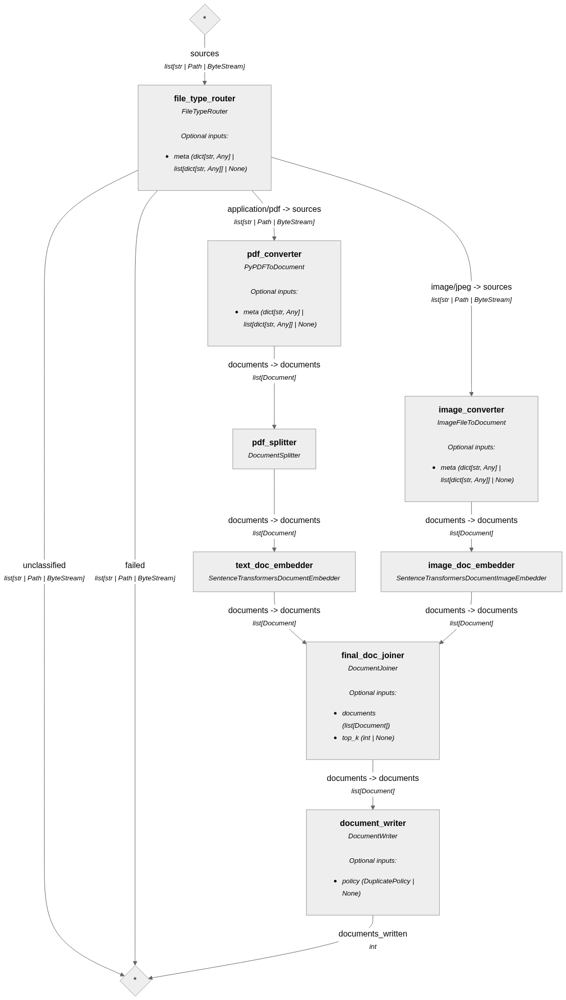

In [6]:
indexing_pipe.show()

### Run the Indexing Pipeline

Let's process our sample files (PDF + images) and store them in the document store. This will embed all documents using the CLIP model so they can be retrieved later.

In [6]:
indexing_result = indexing_pipe.run(
    data={"file_type_router": {"sources": ["attention_is_all_you_need.pdf", "apple.jpg", "capybara.jpg"]}}
)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


In [7]:
indexed_documents = doc_store.filter_documents()
print(f"Indexed {len(indexed_documents)} documents")

'Indexed 17 documents'


### Multimodal Retrieval

In [8]:
from haystack.components.retrievers.in_memory import InMemoryEmbeddingRetriever
from haystack.components.embedders import SentenceTransformersTextEmbedder

text_embedder = SentenceTransformersTextEmbedder(model="sentence-transformers/clip-ViT-L-14", progress_bar=False)
retriever = InMemoryEmbeddingRetriever(document_store=doc_store)
text_embedding = text_embedder.run(text="An image of an apple")["embedding"]
results = retriever.run(text_embedding)["documents"]

for idx, doc in enumerate(results[:5]):
    print(f"Document {idx+1}:")
    print(f"Score: {doc.score}")
    print(f"File Path: {doc.meta['file_path']}")
    print("")

'Document 1:'
'Score: 0.575790009328374'
'File Path: attention_is_all_you_need.pdf'
''
'Document 2:'
'Score: 0.575790009328374'
'File Path: attention_is_all_you_need.pdf'
''
'Document 3:'
'Score: 0.5112777878281352'
'File Path: attention_is_all_you_need.pdf'
''
'Document 4:'
'Score: 0.500057394071375'
'File Path: attention_is_all_you_need.pdf'
''
'Document 5:'
'Score: 0.485217826700958'
'File Path: attention_is_all_you_need.pdf'
''


Huh, that's odd! When searching for "An image of an apple", the top results are all from the PDF paper — not our apple image. This reveals an important limitation: **not all embedding models are equally good at cross-modal retrieval**.

The CLIP model we used (`clip-ViT-L-14`) is a foundational model but newer, more specialized models often perform better for production use cases.

**Try these alternatives for better multimodal performance:**
- [SentenceTransformersDocumentImageEmbedder](https://docs.haystack.deepset.ai/docs/sentencetransformersdocumentimageembedder) or [JinaDocumentImageEmbedder](https://docs.haystack.deepset.ai/docs/jinadocumentimageembedder) → [jina-embeddings-v4](https://huggingface.co/jinaai/jina-embeddings-v4)
- [CohereDocumentImageEmbedder](https://docs.haystack.deepset.ai/docs/coheredocumentimageembedder) → [Cohere Embed 4](https://cohere.com/blog/embed-4)
- [AmazonBedrockDocumentImageEmbedder](https://docs.haystack.deepset.ai/docs/amazonbedrockdocumentimageembedder) → `amazon.titan-embed-image-v1`, `cohere.embed-english-v3`, `cohere.embed-multilingual-v3`

## Creating a Multimodal Agent

Now for the fun part! 🎉 Let's build an **Agent** that can see and understand images.

A multimodal agent is an LLM-powered system that can:
- Understand natural language instructions
- Process images alongside text (when using a Vision Language Model)
- Use tools to perform actions and retrieve information
- Reason about multi-step problems

We'll start with a basic agent using GPT-4o (a Vision Language Model) and then progressively add capabilities.

In [9]:
from haystack.components.agents import Agent
from haystack.components.generators.chat import OpenAIChatGenerator

generator = OpenAIChatGenerator(model="gpt-4o") # Choose a model with vision capabilities
agent = Agent(chat_generator=generator)

In [10]:
from haystack.dataclasses import ImageContent, ChatMessage

apple_image = ImageContent.from_file_path("apple.jpg")
content_parts = ["What fruit is this and what is its color?", apple_image]
messages = agent.run([ChatMessage.from_user(content_parts=content_parts)])["messages"]

print(messages[-1].text)

'This is an apple, and its color is a mix of red and yellow.'


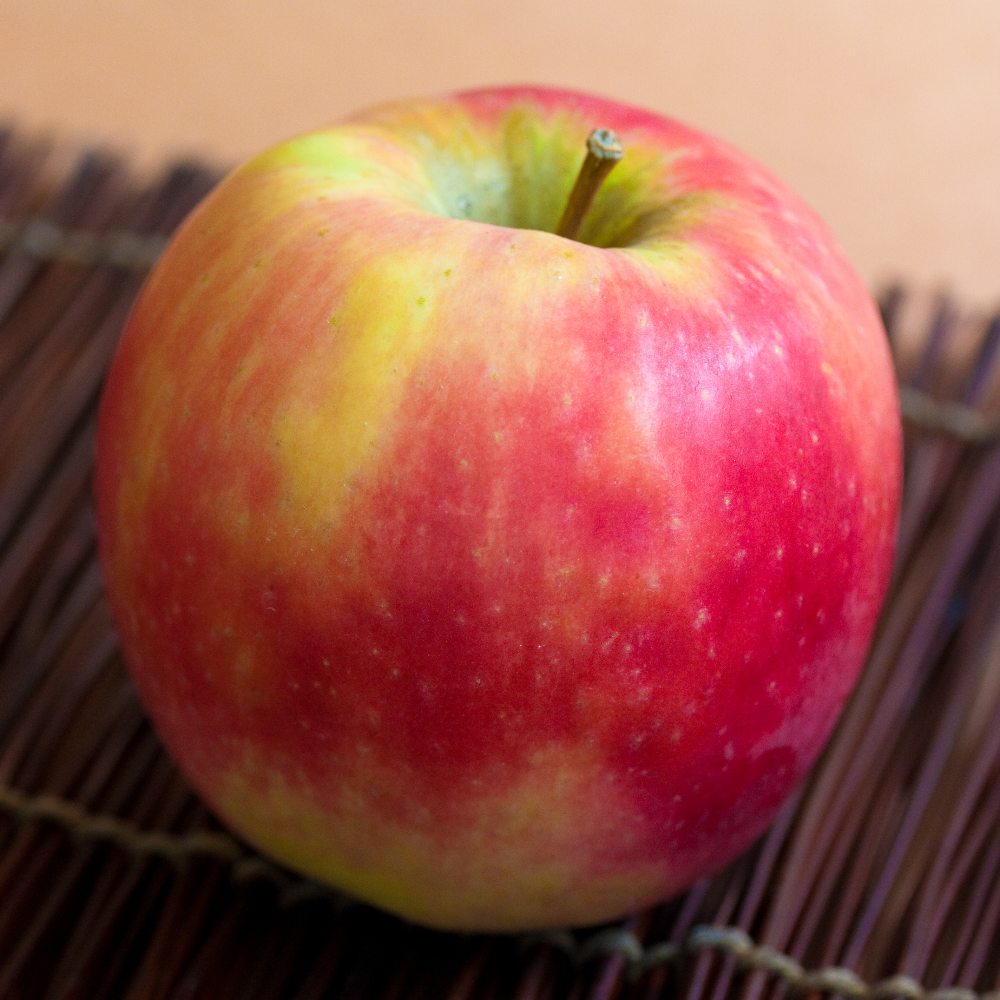

In [ ]:
apple_image.show()

### Creating the First Tool: Database Connection (Retrieval)

Agents become truly powerful when equipped with **tools**. A tool gives the agent the ability to interact with external systems like searching a database, calling an API, or executing code.

Our first tool will be a **retrieval tool** that lets the agent search through company policy documents. This transforms our agent from a simple chatbot into a knowledgeable assistant that can answer questions based on real data.

#### Data Ingestion Pipeline

First, we need to index our company policy documents so the agent can search them. This pipeline:
1. Converts Markdown files to Documents
2. Splits them into smaller chunks (150 words with 50-word overlap)
3. Generates embeddings using `all-MiniLM-L6-v2`
4. Stores everything in an in-memory document store

📚 Learn more: [Tutorial: Preprocessing Different File Types](https://haystack.deepset.ai/tutorials/30_file_type_preprocessing_index_pipeline)

In [11]:
from haystack.components.writers import DocumentWriter
from haystack.components.converters import MarkdownToDocument
from haystack.components.preprocessors import DocumentSplitter, DocumentCleaner
from haystack.components.embedders import SentenceTransformersDocumentEmbedder
from haystack import Pipeline
from haystack.document_stores.in_memory import InMemoryDocumentStore

document_store = InMemoryDocumentStore()
markdown_converter = MarkdownToDocument()
document_cleaner = DocumentCleaner()
document_splitter = DocumentSplitter(split_by="word", split_length=150, split_overlap=50)
document_embedder = SentenceTransformersDocumentEmbedder(model="sentence-transformers/all-MiniLM-L6-v2")
document_writer = DocumentWriter(document_store)

preprocessing_pipeline = Pipeline()
preprocessing_pipeline.add_component(instance=markdown_converter, name="markdown_converter")
# preprocessing_pipeline.add_component(instance=document_joiner, name="document_joiner")
# preprocessing_pipeline.add_component(instance=document_cleaner, name="document_cleaner")
preprocessing_pipeline.add_component(instance=document_splitter, name="document_splitter")
preprocessing_pipeline.add_component(instance=document_embedder, name="document_embedder")
preprocessing_pipeline.add_component(instance=document_writer, name="document_writer")

preprocessing_pipeline.connect("markdown_converter", "document_splitter")
preprocessing_pipeline.connect("document_splitter", "document_embedder")
preprocessing_pipeline.connect("document_embedder", "document_writer")

🚅 Components
  - markdown_converter: MarkdownToDocument
  - document_splitter: DocumentSplitter
  - document_embedder: SentenceTransformersDocumentEmbedder
  - document_writer: DocumentWriter
🛤️ Connections
  - markdown_converter.documents -> document_splitter.documents (list[Document])
  - document_splitter.documents -> document_embedder.documents (list[Document])
  - document_embedder.documents -> document_writer.documents (list[Document])

In [12]:
from pathlib import Path

preprocessing_pipeline.run({"markdown_converter": {"sources": ["/content/social_budget_policy.md"]}})

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Converting markdown files to Documents: 100%|██████████| 1/1 [00:00<00:00, 121.76it/s]


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

{'document_writer': {'documents_written': 4}}

#### Retrieval Pipeline

Now let's create the retrieval pipeline that will power our tool. When the agent needs information, it will:
1. Embed the search query using the same model
2. Find the most similar documents in our store
3. Return the relevant chunks to the agent

In [13]:
from haystack import Pipeline
from haystack.components.embedders import SentenceTransformersTextEmbedder
from haystack.components.retrievers.in_memory import InMemoryEmbeddingRetriever

text_embedder = SentenceTransformersTextEmbedder(model="sentence-transformers/all-MiniLM-L6-v2")
retriever = InMemoryEmbeddingRetriever(document_store)

retrieval_pipeline = Pipeline()
retrieval_pipeline.add_component("text_embedder", text_embedder)
retrieval_pipeline.add_component("retriever", retriever)

retrieval_pipeline.connect("text_embedder.embedding", "retriever.query_embedding")

🚅 Components
  - text_embedder: SentenceTransformersTextEmbedder
  - retriever: InMemoryEmbeddingRetriever
🛤️ Connections
  - text_embedder.embedding -> retriever.query_embedding (list[float])

In [14]:
question = "Social budget"

response = retrieval_pipeline.run({"text_embedder": {"text": question}})

print(response["retriever"]["documents"])

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

[Document(id=48d53f81268e334a5eb6fe0d43614c473e92d99d3ccd843aac1fb284ee3bd336, content: 'be used for social activities involving at least one other deepsetter.
The budget is intended for te...', meta: {'file_path': 'social_budget_policy.md', 'source_id': '5e5c4e1265260fdc86cdc6c2b610537ada3ef788053982f54e44732230e73ff8', 'page_number': 1, 'split_id': 1, 'split_idx_start': 797, '_split_overlap': [{'doc_id': '0dbf5ffdcde83e4eacbaa70796b137568dab535d53e5fbcc1b2ec6325a639e3d', 'range': (797, 1162)}, {'doc_id': '57b9a2cb6ea9486236349925eddca70d914d4a5d2e3878abf7f108fa1fe0351d', 'range': (0, 429)}]}, score: 0.6285462631941386),
 Document(id=57b9a2cb6ea9486236349925eddca70d914d4a5d2e3878abf7f108fa1fe0351d, content: '(e.g. yoga classes, bouldering)
Cultural activities (e.g. movies, exhibitions)
Collaborative or mult...', meta: {'file_path': 'social_budget_policy.md', 'source_id': '5e5c4e1265260fdc86cdc6c2b610537ada3ef788053982f54e44732230e73ff8', 'page_number': 1, 'split_id': 2, 'split_idx_sta

#### Wrapping the Pipeline as a Tool

Now, we'll wrap our retrieval pipeline in a [PipelineTool](https://docs.haystack.deepset.ai/docs/pipelinetool). This allows the agent to:
- Understand what the tool does (via the description)
- Know what inputs it expects (via input mapping)
- Receive formatted outputs it can reason about (via output mapping)

In [15]:
from haystack.tools import PipelineTool

def doc_to_string(documents) -> str:
    result_str = ""
    for document in documents:
        result_str += f"File Content for {document.meta['file_path']}: {document.content}\n\n"
    return result_str

retrieval_tool = PipelineTool(
    pipeline=retrieval_pipeline,
    input_mapping={"query": ["text_embedder.text"]},
    output_mapping={"retriever.documents": "documents"},
    name="retrieval_tool",
    description="Search information for company policies at deepset",
    outputs_to_string={"source": "documents", "handler": doc_to_string},
)

In [16]:
retrieval_tool.parameters

{'description': "A component that combines: 'text_embedder': Embed a single string.",
 'properties': {'query': {'description': "Provided to the 'text_embedder' component as: 'Text to embed.'.",
   'type': 'string'}},
 'required': ['query'],
 'type': 'object'}

### Initialize the Tool-Calling Agent

Time to bring it all together! We'll create an agent with:
- A **system prompt** that defines its persona and behavior
- A **chat generator** (GPT-4o) that can understand both text and images
- A **retrieval tool** to search company policies

The system prompt is crucial, it tells the agent who it is, what tools it has, and how to behave.

In [35]:
from haystack.components.generators.chat import OpenAIChatGenerator

generator = OpenAIChatGenerator(model="gpt-4o") # Choose a VLM or another ChatGenerator for a different model provider

system_prompt = """
You are a helpful deepset agent.
Your users are deepset employees, trying to understand the company policies.
You have access to a list of tools:
  - `retrieval_tool`: to get information on deepset policies like social budget, business trip expenses etc.
Use relevant tools to address the user query if necessary.
Consider all information (image, textual context, previous messages etc.) you have to address the user query.
Share your reasoning with the user with the final statement.
Ask for more info if you don't have enough details to answer a question. Don't make assumptions without relevant info.
Give suggestions or solutions for users questions if possible.
"""

In [36]:
from haystack.components.agents import Agent
from haystack.components.generators.utils import print_streaming_chunk

agent = Agent(
    system_prompt=system_prompt,
    chat_generator=generator,
    tools=[retrieval_tool],
    streaming_callback=print_streaming_chunk
)

In [39]:
from haystack.dataclasses import ChatMessage

result = agent.run(messages=[ChatMessage.from_user("what is the social budget limit?")])

[TOOL CALL]
Tool: retrieval_tool 
Arguments: {"query":"social budget limit"}



Batches:   0%|          | 0/1 [00:00<?, ?it/s]

[TOOL RESULT]
File Content for social_budget_policy.md: be used for social activities involving at least one other deepsetter.
The budget is intended for team-based or small-group activities and not for individual or personal expenses.

3. Budget Allocation

Budget amount: €50 per employee per month
The Social Budget falls under your team budget.
Unused budget does not automatically roll over unless explicitly agreed otherwise by Finance or People Operations.

4. Eligible Social Activities

The Social Budget can be used for a wide range of social activities, provided they have a clear social or team-building purpose.

Examples of eligible activities include (but are not limited to):

Team lunches (on-site or remote)
Coffee, drinks, or informal meetups
Sports or wellness activities (e.g. yoga classes, bouldering)
Cultural activities (e.g. movies, exhibitions)
Collaborative or multiplayer computer games
Team celebrations or milestones

Activities should be inclusive and considerate of te

In [40]:
result["last_message"].text

'The social budget allocated for each deepset employee is €50 per month. This budget is intended for team-based or small-group activities and not for individual or personal expenses. Unused budget does not automatically roll over unless explicitly agreed otherwise by Finance or People Operations. Activities should be focused on fostering social interaction, inclusivity, and team bonding.'

In [41]:
from haystack.dataclasses import ImageContent, ChatMessage

receipt_image = ImageContent.from_file_path("receipt.jpeg")
# content_parts = ["What's the amount of this receipt? ", receipt_image]
# content_parts = ["What is the time of this expense?", receipt_image]
content_parts = ["Can I reimburse this expense as my social budget?", receipt_image]
result = agent.run(messages=[ChatMessage.from_user(content_parts=content_parts)])

[TOOL CALL]
Tool: retrieval_tool 
Arguments: {"query":"social budget reimbursement policy for meal expenses"}



Batches:   0%|          | 0/1 [00:00<?, ?it/s]

[TOOL RESULT]
File Content for social_budget_policy.md: (e.g. yoga classes, bouldering)
Cultural activities (e.g. movies, exhibitions)
Collaborative or multiplayer computer games
Team celebrations or milestones

Activities should be inclusive and considerate of team diversity, time zones, and accessibility needs.

5. Meal-Specific Guidelines

To ensure fairness and consistency, the following rules apply when the Social Budget is used for meals:

The maximum reimbursable amount is €10 per person.
Meal-based social activities must take place between 12:30 and 13:30 (local time).
Meals outside this time window (e.g. dinners or late lunches) are not covered by the Social Budget.

6. Budget Management and Approval

The Social Budget is managed by your team manager.
Managers may plan or approve social activities in agreement with the team.
Teams are encouraged to openly discuss how the budget is used to ensure fairness and transparency.

7. Cost Center and Expense Reporting

Cost Center: Use

## Short-Term Memory (Conversational Agent)

So far, our agent treats each message independently — it has no memory of previous conversations. Let's fix that by adding **conversational memory**!

With memory, the agent can:
- Remember context from earlier in the conversation
- Refer back to images or documents even tool results shared previously
- Build on previous answers without repeating information

We'll use `InMemoryChatMessageStore` to store chat history and retrieve it for each new message.

📚 Learn more: [Tutorial: Conversational RAG Agent using InMemoryChatMessageStore](https://haystack.deepset.ai/tutorials/48_conversational_rag)

In [42]:
## Import from experimental
from haystack_experimental.chat_message_stores.in_memory import InMemoryChatMessageStore
from haystack_experimental.components.retrievers import ChatMessageRetriever
from haystack_experimental.components.writers import ChatMessageWriter

# Chat History components
message_store = InMemoryChatMessageStore()
message_retriever = ChatMessageRetriever(message_store)
message_writer = ChatMessageWriter(message_store)

In [43]:
from haystack import Pipeline

conversational_agent = Pipeline()

conversational_agent.add_component("agent", agent)
# components for chat history storage and retrieval
conversational_agent.add_component("message_retriever", ChatMessageRetriever(message_store))
conversational_agent.add_component("message_writer", ChatMessageWriter(message_store))

# connections for the pipeline
conversational_agent.connect("message_retriever.messages", "agent.messages")
conversational_agent.connect("agent.messages", "message_writer")

🚅 Components
  - agent: Agent
  - message_retriever: ChatMessageRetriever
  - message_writer: ChatMessageWriter
🛤️ Connections
  - agent.messages -> message_writer.messages (list[ChatMessage])
  - message_retriever.messages -> agent.messages (list[ChatMessage])

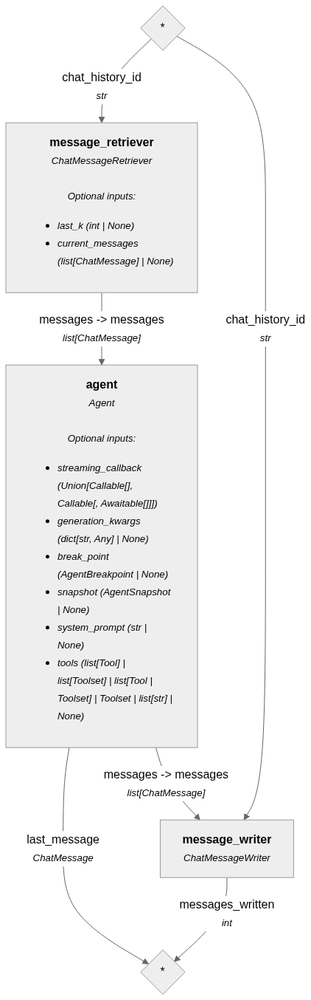

In [ ]:
conversational_agent.show()

In [44]:
from haystack.dataclasses import ImageContent, ChatMessage

receipt_image = ImageContent.from_file_path("receipt.jpeg")
content_parts = ["Can I reimburse this expense as my social budget?", receipt_image]
chat_history_id = "chat_1"

result = conversational_agent.run(
    data={
        "message_retriever": {
            "current_messages": [ChatMessage.from_user(content_parts=content_parts)],
            "chat_history_id": chat_history_id,
        },
        "message_writer": {"chat_history_id": chat_history_id},
    }
)

[TOOL CALL]
Tool: retrieval_tool 
Arguments: {"query":"deepset social budget reimbursement policy"}



Batches:   0%|          | 0/1 [00:00<?, ?it/s]

[TOOL RESULT]
File Content for social_budget_policy.md: deepset Social Budget Policy

1. Purpose and Objectives

At deepset, we believe that strong human connections are a key ingredient for effective collaboration, innovation, and a healthy company culture. The Social Budget exists to support these values by encouraging regular social interaction among deepsetters in a relaxed, non-work-focused context.

The objectives of the Social Budget are to:

Encourage regular social interaction and team bonding
Support both on-site and remote team activities
Promote inclusivity, well-being, and cross-team collaboration
Strengthen deepset’s culture in a sustainable and transparent way

2. Scope and Eligibility

The Social Budget applies to all deepset employees (“deepsetters”).

Each deepsetter is allocated a fixed monthly budget.
The budget can only be used for social activities involving at least one other deepsetter.
The budget is intended for team-based or small-group activities and not for 

In [45]:
result = conversational_agent.run(
    data={
        "message_retriever": {
            "current_messages": [ChatMessage.from_user("What is the total amount for social budget per month?")],
            "chat_history_id": chat_history_id,
        },
        "message_writer": {"chat_history_id": chat_history_id},
    }
)

[ASSISTANT]
The total social budget for each deepset employee is €50 per month.



#### Inspecting the Conversation History

Want to see what the agent remembers? We can retrieve all messages stored for a specific chat session. This is useful for debugging and understanding how the agent maintains context.

In [46]:
message_store.retrieve_messages(chat_history_id=chat_history_id)

[ChatMessage(_role=<ChatRole.USER: 'user'>, _content=[TextContent(text='Can I reimburse this expense as my social budget?'), ImageContent(base64_image='/9j/4AAQSkZJRgABAgEASABIAAD/4R1FRXhpZgAATU0AKgAAAAgADAEPAAIAAAAGAAAAngEQAAIAAAAKAAAApAESAAMAAAABAAYA...', mime_type='image/jpeg', detail=None, meta={'file_path': 'receipt.jpeg'})], _name=None, _meta={'chat_message_id': '0'}),
 ChatMessage(_role=<ChatRole.ASSISTANT: 'assistant'>, _content=[ToolCall(tool_name='retrieval_tool', arguments={'query': 'deepset social budget reimbursement policy'}, id='call_4ViURprESOKaVHAvOBzLpO4y', extra=None)], _name=None, _meta={'chat_message_id': '1', 'model': 'gpt-4o-2024-08-06', 'index': 0, 'finish_reason': 'tool_calls', 'completion_start_time': '2026-01-19T12:50:01.923306', 'usage': None}),
 ChatMessage(_role=<ChatRole.TOOL: 'tool'>, _content=[ToolCallResult(result='File Content for social_budget_policy.md: deepset Social Budget Policy\n\n1. Purpose and Objectives\n\nAt deepset, we believe that strong h

### Add Another Tool: Reimbursement Submission

Let's make our agent even more capable by adding a second tool — one that can actually **take action** by submitting reimbursement requests.

This demonstrates how to create a custom tool using the `@tool` decorator. The function's docstring becomes the tool description, and type annotations define the expected parameters.

In [47]:
from haystack.tools import tool
from typing import Literal, Annotated

@tool
def send_reimbursement(
    amount: Annotated[float, "the exact amount of the spend"],
    currency: Annotated[Literal["eur", "usd"], "the currency of the spend"],
    description: Annotated[str, "the description of the spend"]
    ) -> str:
  '''
  A simple tool to send the reimbursement requests with amount, currency and description details
  '''
  if amount > 10:
    return "This amount cannot be reimbursed"
  return "We received your request ;)"

In [56]:
from haystack.components.agents import Agent
from haystack.components.generators.utils import print_streaming_chunk

system_prompt = """
You are a helpful deepset agent.
Your users are deepset employees, trying to understand the company policies.
You have access to a list of tools:
  - `retrieval_tool`: to get information on deepset policies like social budget, business trip expenses etc.
  - `send_reimbursement`: to submit reimbursement requests to the internal finance tool
Use relevant tools to address the user query if necessary.
Consider all information (image, textual context, previous messages etc.) you have to address the user query.
Share your reasoning with the user with the final statement.
Ask for more info if you don't have enough details to answer a question. Don't make assumptions without relevant info.
Give suggestions or solutions for users questions if possible.
"""

agent = Agent(
    system_prompt=system_prompt,
    chat_generator=generator,
    tools=[retrieval_tool, send_reimbursement],
    streaming_callback=print_streaming_chunk
)

In [57]:
from haystack import Pipeline

conversational_agent = Pipeline()

conversational_agent.add_component("agent", agent)
# components for chat history storage and retrieval
conversational_agent.add_component("message_retriever", ChatMessageRetriever(message_store))
conversational_agent.add_component("message_writer", ChatMessageWriter(message_store))

# connections for the pipeline
conversational_agent.connect("message_retriever.messages", "agent.messages")
conversational_agent.connect("agent.messages", "message_writer")

🚅 Components
  - agent: Agent
  - message_retriever: ChatMessageRetriever
  - message_writer: ChatMessageWriter
🛤️ Connections
  - agent.messages -> message_writer.messages (list[ChatMessage])
  - message_retriever.messages -> agent.messages (list[ChatMessage])

In [61]:
chat_history_id = "chat_5"
result = conversational_agent.run(
    data={
        "message_retriever": {
            "current_messages": [ChatMessage.from_user("What is the total amount for social budget per month?")],
            "chat_history_id": chat_history_id,
        },
        "message_writer": {"chat_history_id": chat_history_id},
    }
)

[TOOL CALL]
Tool: retrieval_tool 
Arguments: {"query":"Total amount for social budget per month at deepset"}



Batches:   0%|          | 0/1 [00:00<?, ?it/s]

[TOOL RESULT]
File Content for social_budget_policy.md: deepset Social Budget Policy

1. Purpose and Objectives

At deepset, we believe that strong human connections are a key ingredient for effective collaboration, innovation, and a healthy company culture. The Social Budget exists to support these values by encouraging regular social interaction among deepsetters in a relaxed, non-work-focused context.

The objectives of the Social Budget are to:

Encourage regular social interaction and team bonding
Support both on-site and remote team activities
Promote inclusivity, well-being, and cross-team collaboration
Strengthen deepset’s culture in a sustainable and transparent way

2. Scope and Eligibility

The Social Budget applies to all deepset employees (“deepsetters”).

Each deepsetter is allocated a fixed monthly budget.
The budget can only be used for social activities involving at least one other deepsetter.
The budget is intended for team-based or small-group activities and not for 

In [62]:
from haystack.dataclasses import ImageContent, ChatMessage

receipt_image = ImageContent.from_file_path("receipt.jpeg")
content_parts = ["I had lunch with Alex and Jack. Here's the receipt. Can I reimburse this expense as my social budget?", receipt_image]

result = conversational_agent.run(
    data={
        "message_retriever": {
            "current_messages": [ChatMessage.from_user(content_parts=content_parts)],
            "chat_history_id": chat_history_id,
        },
        "message_writer": {"chat_history_id": chat_history_id},
    }
)

[ASSISTANT]
It looks like the lunch expense was €10.40, which is within the social budget guidelines, as each person can be reimbursed up to €10. Since you had lunch with Alex and Jack, it involves the required social aspect. 

You can proceed to request reimbursement under the social budget. Would you like me to help with this submission?



In [63]:
result = conversational_agent.run(
    data={
        "message_retriever": {
            "current_messages": [ChatMessage.from_user(content_parts="Yes please, submit it")],
            "chat_history_id": chat_history_id,
        },
        "message_writer": {"chat_history_id": chat_history_id},
    }
)

[TOOL CALL]
Tool: send_reimbursement 
Arguments: {"amount":10.4,"currency":"eur","description":"Lunch with Alex and Jack at Alata Ramen"}

[TOOL RESULT]
This amount cannot be reimbursed

[ASSISTANT]
It seems there was an issue with submitting the reimbursement. You might want to double-check the policies or consult with your manager for further assistance. Let me know if there's anything else I can do!



## Human-in-the-Loop 🔁

Some actions are too important to let an AI execute autonomously — like submitting expenses or making payments. **Human-in-the-Loop (HITL)** adds a confirmation step before critical tool executions.

We can configure different policies for different tools:
- **AlwaysAskPolicy**: Require human approval every time (for sensitive actions)
- **AskOncePolicy**: Ask once, then remember the decision (e.g. for access to the certain tools)
- **NeverAskPolicy**: No confirmation needed, by default (for safe, read-only tools)

📚 Learn more: [Tutorial: Human-in-the-Loop Agent](https://haystack.deepset.ai/tutorials/47_human_in_the_loop_agent)

In [64]:
from haystack_experimental.components.agents.agent import Agent
from haystack_experimental.components.agents.human_in_the_loop import (
    AlwaysAskPolicy,
    AskOncePolicy,
    BlockingConfirmationStrategy,
    NeverAskPolicy,
    RichConsoleUI,
    SimpleConsoleUI,
)
from rich.console import Console

cons = Console()

agent = Agent(
    system_prompt=system_prompt,
    chat_generator=generator,
    tools=[retrieval_tool, send_reimbursement],
    streaming_callback=print_streaming_chunk,
    confirmation_strategies={
        send_reimbursement.name: BlockingConfirmationStrategy(
            confirmation_policy=AlwaysAskPolicy(), confirmation_ui=RichConsoleUI(console=cons)
        ),
        retrieval_tool.name: BlockingConfirmationStrategy(
            confirmation_policy=AskOncePolicy(), confirmation_ui=RichConsoleUI(console=cons)
        ),
    },
)

In [65]:
from haystack import Pipeline

conversational_agent = Pipeline()

conversational_agent.add_component("agent", agent)
# components for chat history storage and retrieval
conversational_agent.add_component("message_retriever", ChatMessageRetriever(message_store))
conversational_agent.add_component("message_writer", ChatMessageWriter(message_store))

# connections for the pipeline
conversational_agent.connect("message_retriever.messages", "agent.messages")
conversational_agent.connect("agent.messages", "message_writer")

🚅 Components
  - agent: Agent
  - message_retriever: ChatMessageRetriever
  - message_writer: ChatMessageWriter
🛤️ Connections
  - agent.messages -> message_writer.messages (list[ChatMessage])
  - message_retriever.messages -> agent.messages (list[ChatMessage])

In [ ]:
from haystack.dataclasses import ImageContent, ChatMessage

receipt_image = ImageContent.from_file_path("receipt.jpeg")
content_parts = ["Can I reimburse this expense as my social budget?", receipt_image]
chat_history_id = "chat_3"

result = conversational_agent.run(
    data={
        "message_retriever": {
            "current_messages": [ChatMessage.from_user(content_parts=content_parts)],
            "chat_history_id": chat_history_id,
        },
        "message_writer": {"chat_history_id": chat_history_id},
    }
)

[TOOL CALL]
Tool: retrieval_tool 
Arguments: {"query":"social budget reimbursement policy"}



╭─ 🔧 Tool Execution Request ─────────────────────────────────────────────────────────────────────────────────────╮
│ Tool: retrieval_tool                                                                                            │
│ Description: Search information for company policies at deepset                                                 │
│                                                                                                                 │
│ Arguments:                                                                                                      │
│ query: social budget reimbursement policy                                                                       │
╰─────────────────────────────────────────────────────────────────────────────────────────────────────────────────╯

Your choice [y/n/m] (y):

y


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

[TOOL RESULT]
File Content for social_budget_policy.md: be used for social activities involving at least one other deepsetter.
The budget is intended for team-based or small-group activities and not for individual or personal expenses.

3. Budget Allocation

Budget amount: €50 per employee per month
The Social Budget falls under your team budget.
Unused budget does not automatically roll over unless explicitly agreed otherwise by Finance or People Operations.

4. Eligible Social Activities

The Social Budget can be used for a wide range of social activities, provided they have a clear social or team-building purpose.

Examples of eligible activities include (but are not limited to):

Team lunches (on-site or remote)
Coffee, drinks, or informal meetups
Sports or wellness activities (e.g. yoga classes, bouldering)
Cultural activities (e.g. movies, exhibitions)
Collaborative or multiplayer computer games
Team celebrations or milestones

Activities should be inclusive and considerate of te

In [ ]:
result = conversational_agent.run(
    data={
        "message_retriever": {
            "current_messages": [ChatMessage.from_user("Can you go ahead and submit it as a social budget?")],
            "chat_history_id": chat_history_id,
        },
        "message_writer": {"chat_history_id": chat_history_id},
    }
)

[ASSISTANT]
To submit the reimbursement, I'll need a description of the activity and the name(s) of the involved deepsetter(s). Could you please provide that information?



In [ ]:
result = conversational_agent.run(
    data={
        "message_retriever": {
            "current_messages": [ChatMessage.from_user("Vladimir and Julian was involved, we went out for lunch together")],
            "chat_history_id": chat_history_id,
        },
        "message_writer": {"chat_history_id": chat_history_id},
    }
)

[TOOL CALL]
Tool: send_reimbursement 
Arguments: {"amount":10,"currency":"eur","description":"Vladimir and Julian, lunch outing"}



╭─ 🔧 Tool Execution Request ─────────────────────────────────────────────────────────────────────────────────────╮
│ Tool: send_reimbursement                                                                                        │
│ Description:                                                                                                    │
│   A simple tool to send the reimbursement requests with amount, currency and description details                │
│                                                                                                                 │
│                                                                                                                 │
│ Arguments:                                                                                                      │
│ amount: 10                                                                                                      │
│ currency: eur                                                                                                   │
│ description: Vladimir and Julian, lunch outing                                                                  │
╰─────────────────────────────────────────────────────────────────────────────────────────────────────────────────╯

Your choice [y/n/m] (y):

m


Modify 'amount' (10):

10.4


Modify 'currency' (eur):

Modify 'description' (Vladimir and Julian, lunch outing):


[TOOL RESULT]
This amount cannot be reimbursed

[ASSISTANT]
It looks like the amount cannot be reimbursed because it exceeds the maximum limit of €10 per person for meal-related social events. You can adjust the amount to €10 and resubmit. Let me know if you'd like me to do that for you!



In [ ]:
result = conversational_agent.run(
    data={
        "message_retriever": {
            "current_messages": [ChatMessage.from_user("Okay let's submit it with 10 euros then")],
            "chat_history_id": chat_history_id,
        },
        "message_writer": {"chat_history_id": chat_history_id},
    }
)

[TOOL CALL]
Tool: send_reimbursement 
Arguments: {"amount":10,"currency":"eur","description":"Vladimir and Julian, lunch outing"}



╭─ 🔧 Tool Execution Request ─────────────────────────────────────────────────────────────────────────────────────╮
│ Tool: send_reimbursement                                                                                        │
│ Description:                                                                                                    │
│   A simple tool to send the reimbursement requests with amount, currency and description details                │
│                                                                                                                 │
│                                                                                                                 │
│ Arguments:                                                                                                      │
│ amount: 10                                                                                                      │
│ currency: eur                                                                                                   │
│ description: Vladimir and Julian, lunch outing                                                                  │
╰─────────────────────────────────────────────────────────────────────────────────────────────────────────────────╯

Your choice [y/n/m] (y):

y
[TOOL RESULT]
We received your request ;)

[ASSISTANT]
Your reimbursement for €10 has been successfully submitted with the description "Vladimir and Julian, lunch outing." If you have any more questions, feel free to ask!



## Interactive Chat Mode

Let's create a simple interactive chat loop so you can have a real conversation with the agent. Type your questions and see the agent use its tools, memory, and reasoning in action. Type **Q** to exit.

In [ ]:
while True:
    question = input("Enter your question or Q to exit.\n🧑 ")
    if question == "Q":
        break

    conversational_agent.run(
        data={
            "message_retriever": {
                "current_messages": [ChatMessage.from_user(question)],
                "chat_history_id": chat_history_id,
            },
            "message_writer": {"chat_history_id": chat_history_id},
        }
    )

Enter your question or Q to exit.
🧑 What is the social budget amount?
[ASSISTANT]
The social budget is €50 per employee per month. Let me know if you need more information!

Enter your question or Q to exit.
🧑 Q


## 🚀 Next Steps: Build a Gradio UI

Want to turn this into a polished demo? Consider building a Gradio interface that allows users to:
- Upload images directly
- Chat with the agent in a beautiful UI
- See tool calls and responses in real-time

Check out [Gradio's Chatbot component](https://www.gradio.app/docs/gradio/chatbot) for building conversational interfaces!